# Self-Supervised Learning

In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from typing import Any, Optional, Iterable
from dataclasses import dataclass

import os

import numpy as np
from matplotlib import pyplot as plt
%config InlineBackend.figure_formats = {'retina', 'png'}

import torch
from torch import nn, optim, Tensor
from torch.nn import functional as F
from torch.utils import data

from torchvision import models, datasets, transforms as VT
import lightning as L

from lightly.transforms.utils import IMAGENET_NORMALIZE

@dataclass
class Arguments:
    num_workers:int = len(os.sched_getaffinity(0))
    
args = Arguments(); args

Arguments(num_workers=16)

From what I read, SSL consist of three major things: - Backbone,
projection head, and augmentation protocol.

In [3]:
torch.set_float32_matmul_precision('medium')

In [4]:
from lightly.loss import NTXentLoss
from lightly.models.modules import SimCLRProjectionHead
from lightly.transforms.simclr_transform import SimCLRTransform

class SimCLR(L.LightningModule):
    def __init__(self) -> None:
        super().__init__()
        #self.resnet = models.resnet18()
        resnet = models.resnet34()
        self.resnet = resnet
        self.backbone = nn.Sequential(*list(resnet.children())[:-1])
        self.projection_head = SimCLRProjectionHead(512, 2048, 2048)
        self.criterion = NTXentLoss()

    def forward(self, x):
        x = self.backbone(x).flatten(start_dim=1)
        z = self.projection_head(x)
        return z
    
    def training_step(self, batch, batch_idx):
        (x0, x1), _ = batch
        z0 = self.forward(x0)
        z1 = self.forward(x1)
        loss = self.criterion(z0, z1)
        self.log("train_loss", loss, prog_bar=True, on_epoch=True)
        return loss
    
    def predict_step(self, batch, batch_idx):
        samples, labels = batch
        outputs = self.backbone(samples).flatten(start_dim=1)
        return outputs

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True, eps=0.5),
                "monitor": "train_loss_epoch",
            }
        }

        return optimizer


In [5]:
class UnNormalize(object):
    def __init__(self, mean: Iterable[float], std: Iterable[float]):
        self.mean = mean
        self.std = std

    def __call__(self, tensor: Tensor) -> Tensor:
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
            # The normalize code -> t.sub_(m).div_(s)
        return tensor


### Self-supervised pretraining dataset
pretrain_transform = SimCLRTransform(input_size=32)
pretrainset = datasets.CIFAR10(root='~/datasets/cifar10', train=True, download=False, transform=pretrain_transform)
pretrain_loader = data.DataLoader(pretrainset, batch_size=256, shuffle=True, drop_last=True, pin_memory=True, num_workers=args.num_workers)


### Classification training
trainset_transform = VT.Compose([
    VT.ToTensor(),
    VT.Normalize(mean=IMAGENET_NORMALIZE["mean"], std=IMAGENET_NORMALIZE["std"] ,inplace=False),
])
trainset = datasets.CIFAR10(root='~/datasets/cifar10', train=True, download=False, transform=trainset_transform)
trainset_loader = data.DataLoader(trainset, batch_size=256, shuffle=True, drop_last=True, pin_memory=True, num_workers=args.num_workers)

### Evaluation
testset_transform = trainset_transform
testset = datasets.CIFAR10(root='~/datasets/cifar10', train=False, download=False, transform=testset_transform)
testset_loader = data.DataLoader(testset, batch_size=256, shuffle=False, drop_last=False, num_workers=args.num_workers)

### Visualization testset
vis_testset = datasets.CIFAR10(root='~/datasets/cifar10', train=False, download=False, transform=None)

reverse_transform = VT.Compose([
    UnNormalize(mean=IMAGENET_NORMALIZE["mean"], std=IMAGENET_NORMALIZE["std"]),
    VT.ToPILImage(),
])


trainer = L.Trainer(
    max_epochs=1000,
    devices=1,
    accelerator='cuda',
    precision='bf16-mixed',
    benchmark=True,
    logger=False,
    #accumulate_grad_batches=8,
    #enable_checkpointing=False,
)

model = SimCLR()
#trainer.fit(model=model, train_dataloaders=pretrain_loader)

model = SimCLR.load_from_checkpoint('./checkpoints/epoch=999-step=195000.ckpt')

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

In [7]:
from copy import deepcopy
from sklearn.metrics import accuracy_score, f1_score

class Classifier(L.LightningModule):
    def __init__(self, backbone: nn.Module, n_classes:int=10):
        super().__init__()

        # Copy the original net
        self.backbone = deepcopy(backbone)

        # Freeze the feature extraction layers (backbone)
        for param in self.backbone.parameters():
            param.requires_grad = False

        self.classifier = nn.Linear(512, n_classes)
        self.criterion = F.cross_entropy

        self.labels_true = []
        self.labels_pred = []

    def forward(self, x):
        x = self.backbone(x).flatten(start_dim=1)
        x = self.classifier(x)
        return x

    def training_step(self, batch, batch_idx):
        inputs, targets = batch
        outputs = self.forward(inputs)
        loss = self.criterion(outputs, targets)
        self.log("train_loss", loss, prog_bar=True)
        return loss
    
    def validation_step(self, batch, batch_idx, dataloader_idx=0):
        inputs, targets = batch
        outputs = self.forward(inputs)
        #loss = self.criterion(outputs, targets)

        self.labels_true.append(targets)
        self.labels_pred.append(torch.argmax(outputs, dim=1))
        
        #self.log("val_loss", loss, prog_bar=True)
        
    def on_validation_epoch_end(self):
        y_true = torch.cat(self.labels_true).cpu().numpy()
        y_pred = torch.cat(self.labels_pred).cpu().numpy()
        
        acc = accuracy_score(y_true, y_pred)
        f1 = f1_score(y_true, y_pred, average='weighted')

        self.log('val_acc', acc, prog_bar=True, on_step=False, on_epoch=True)
        self.log('val_f1', f1, prog_bar=True, on_step=False, on_epoch=True)

        # Do something with all predict
        self.labels_true.clear()  # free memory
        self.labels_pred.clear()

        print(f"ACC: {acc*100:.1f}%  F1: {f1*100:.1f}%")

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True, eps=0.5),
                "monitor": "val_acc",
            }
        }

clf = Classifier(model.backbone)

trainer = L.Trainer(
    max_epochs=64,
    devices=1,
    accelerator='cuda',
    precision='bf16-mixed',
    benchmark=True,
    logger=False,
    enable_checkpointing=False,
    enable_progress_bar=False
)

trainer.fit(model=clf, train_dataloaders=testset_loader, val_dataloaders=testset_loader)
#trainer.validate(model=clf, dataloaders=testset_loader)

Using bfloat16 Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | backbone   | Sequential | 21.3 M
1 | classifier | Linear     | 5.1 K 
------------------------------------------
5.1 K     Trainable params
21.3 M    Non-trainable params
21.3 M    Total params
85.159    Total estimated model params size (MB)
`Trainer.fit` stopped: `max_epochs=64` reached.

ACC: 13.7%  F1: 6.8%
ACC: 73.0%  F1: 72.5%
ACC: 75.8%  F1: 75.7%
ACC: 75.8%  F1: 75.7%
ACC: 76.0%  F1: 76.0%
ACC: 76.4%  F1: 76.5%
ACC: 76.8%  F1: 76.9%
ACC: 77.2%  F1: 77.3%
ACC: 77.5%  F1: 77.5%
ACC: 77.7%  F1: 77.7%
ACC: 78.0%  F1: 78.0%
ACC: 78.2%  F1: 78.2%
ACC: 78.3%  F1: 78.3%
ACC: 78.5%  F1: 78.5%
ACC: 78.6%  F1: 78.5%
ACC: 78.5%  F1: 78.5%
ACC: 78.6%  F1: 78.5%
ACC: 78.6%  F1: 78.6%
ACC: 78.8%  F1: 78.7%
ACC: 78.9%  F1: 78.8%
ACC: 79.0%  F1: 79.0%
ACC: 79.2%  F1: 79.1%
ACC: 79.3%  F1: 79.2%
ACC: 79.3%  F1: 79.2%
ACC: 79.3%  F1: 79.2%
ACC: 79.4%  F1: 79.3%
ACC: 79.4%  F1: 79.3%
ACC: 79.6%  F1: 79.5%
ACC: 79.5%  F1: 79.4%
ACC: 79.7%  F1: 79.5%
ACC: 79.8%  F1: 79.7%
ACC: 79.8%  F1: 79.6%
ACC: 79.8%  F1: 79.7%
ACC: 79.8%  F1: 79.6%
ACC: 80.0%  F1: 79.8%
ACC: 79.9%  F1: 79.7%
ACC: 79.9%  F1: 79.8%
ACC: 80.1%  F1: 80.0%
ACC: 80.2%  F1: 80.0%
ACC: 80.2%  F1: 80.0%
ACC: 80.2%  F1: 80.0%
ACC: 80.2%  F1: 80.0%
ACC: 80.2%  F1: 80.0%
ACC: 80.4%  F1: 80.2%
ACC: 80.5%  F1: 80.3%
ACC: 80.3% 

In [8]:
embeddings = trainer.predict(model=model, dataloaders=testset_loader, return_predictions=True)
embeddings = torch.cat(embeddings).float().numpy()

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

In [9]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('cluster', TSNE(n_jobs=-1, random_state=42))
])

#scaler = StandardScaler()
#X = TSNE(n_jobs=-1, random_state=42).fit_transform(embeddings)
#X = scaler.fit_transform(X)

X = pipeline.fit_transform(embeddings)
samples = np.asarray([x for x, _ in vis_testset])
labels = np.asarray([label for _, label in vis_testset])

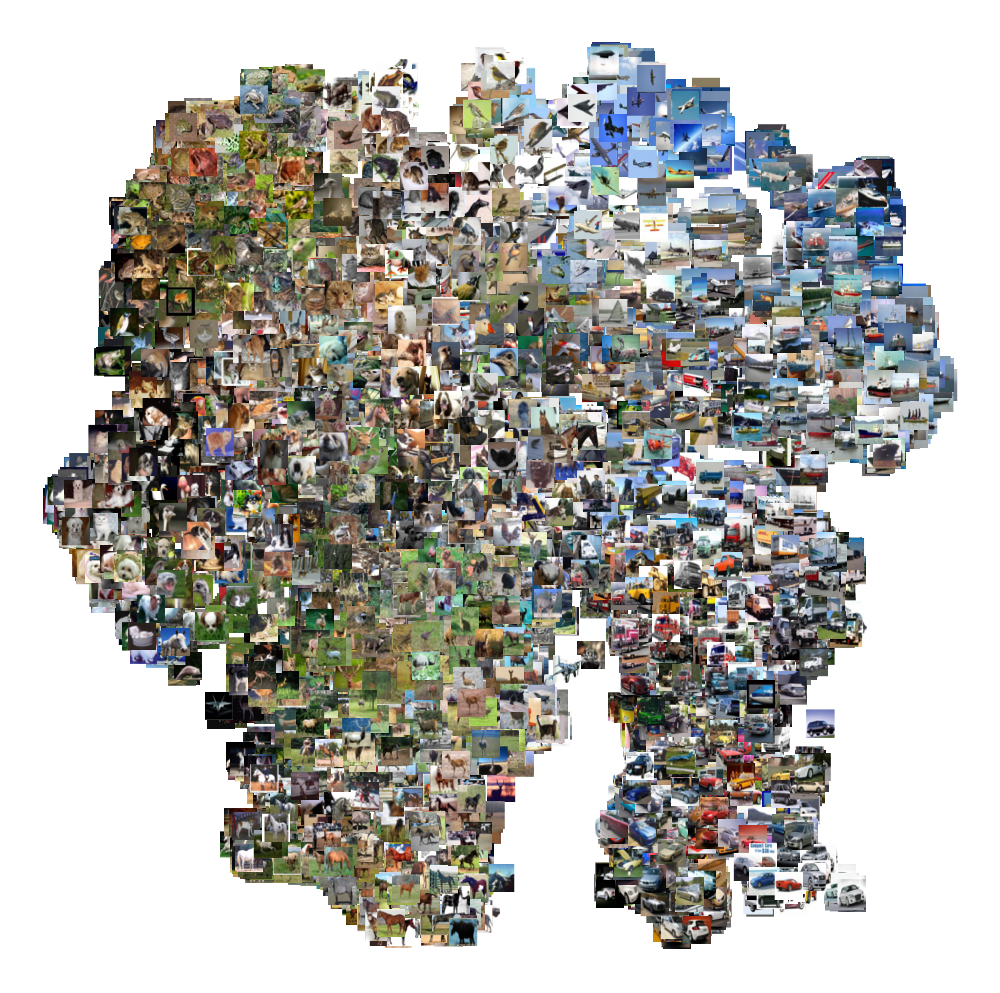

In [10]:
from matplotlib import offsetbox
from PIL.Image import Image

def plot_embeddings(
        x1: np.ndarray,
        x2: np.ndarray,
        samples: Iterable[np.ndarray | Image | Tensor],
        labels: Iterable[int | str] | None = None,
        min_distance: float = 0.1,
        zoom: float = 0.5,
        ax: Any | None = None,
) -> Any:
    
    if ax is None:
        ax = plt.gca()

    # Requires matplotlib >= 1.0
    X = np.stack([x1, x2], axis=-1)

    shown_images = np.array([[np.inf, np.inf]])
    for i in range(X.shape[0]):
        dist = np.sum((X[i] - shown_images) ** 2, 1)
        if np.min(dist) < min_distance:
            # don't show points that are too close
            continue

        sample = samples[i]

        if isinstance(sample, Tensor):
            sample = sample.permute(1, 2, 0).numpy()

        if isinstance(sample, Image):
            sample = np.asarray(sample)

        #assert sample.shape != (32, 32, 3), sample.shape

        shown_images = np.r_[shown_images, [X[i]]]
        im = offsetbox.OffsetImage(sample, zoom=zoom)
        ab = offsetbox.AnnotationBbox(offsetbox=im, xy=X[i], frameon=False)
        ax.add_artist(ab)

    return ax


fig, ax = plt.subplots(figsize=(10, 10), dpi=192)
ax.axis('off')
x0, x1 = X[:,0], X[:,1]

plt.scatter(x0, x1, marker='.', edgecolors='none', alpha=0.0)
plot_embeddings(x0, x1, samples=samples, ax=ax)
plt.show()

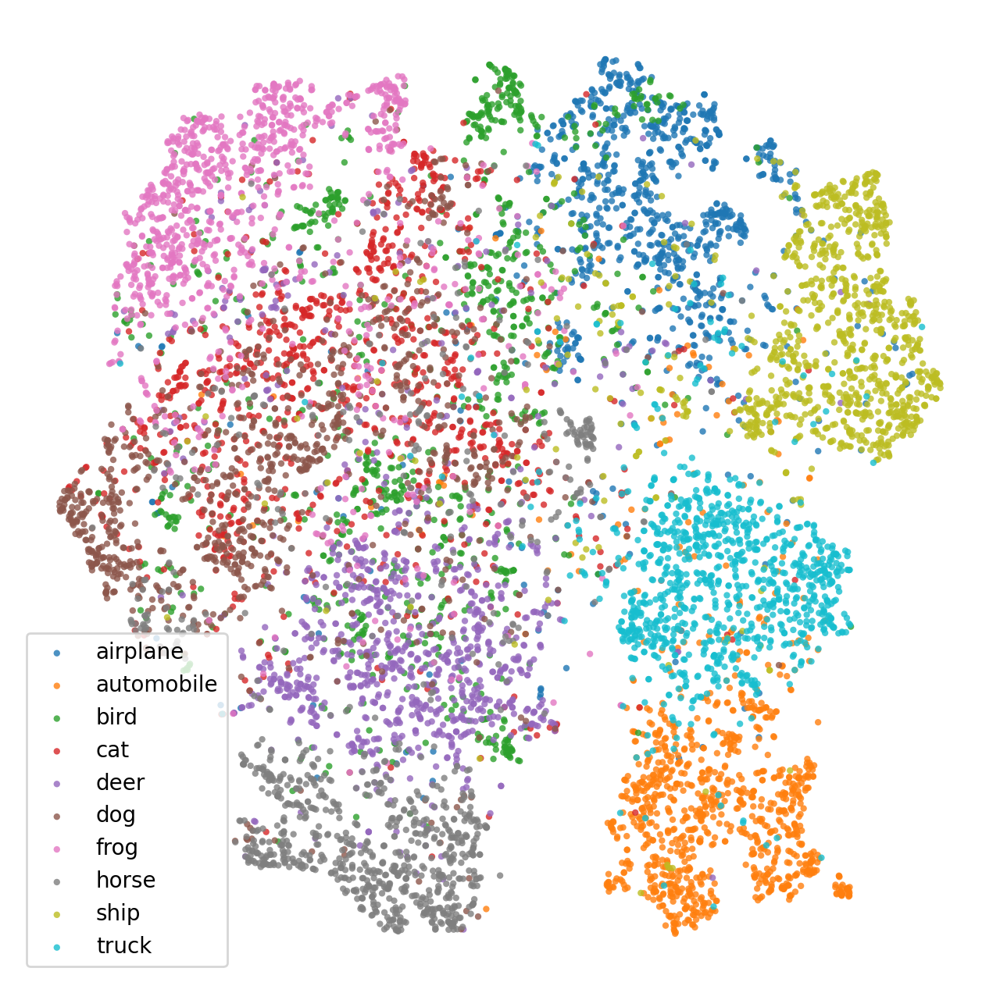

In [12]:
import matplotlib as mpl

classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

#cmap = mpl.colormaps.get_cmap('jet').resampled(10)
cmap = mpl.colormaps.get_cmap('tab10')


fig, ax = plt.subplots(figsize=(8, 8))
for label in sorted(set(labels)):
    ax.scatter(X[labels==label, 0], X[labels==label, 1], color=cmap(label), marker='.', edgecolors='none', alpha=0.8, label=classes[label])

ax.axis('off')
ax.legend()
plt.show()

In [13]:
from captum.attr import IntegratedGradients, GuidedBackprop, GradientShap

/home/gcerar/miniconda3/envs/quarto/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm

In [16]:
clf.eval()
gbp = GuidedBackprop(deepcopy(clf))
#ig = IntegratedGradients(deepcopy(clf))

sample_norm, label = testset[1555]
sample = reverse_transform(sample_norm.clone())

attr = gbp.attribute(sample_norm.unsqueeze(0), target=label)
attr = attr.squeeze().permute(1, 2, 0).numpy()
attr = np.sum(np.abs(attr), axis=-1)
attr.shape

(32, 32)

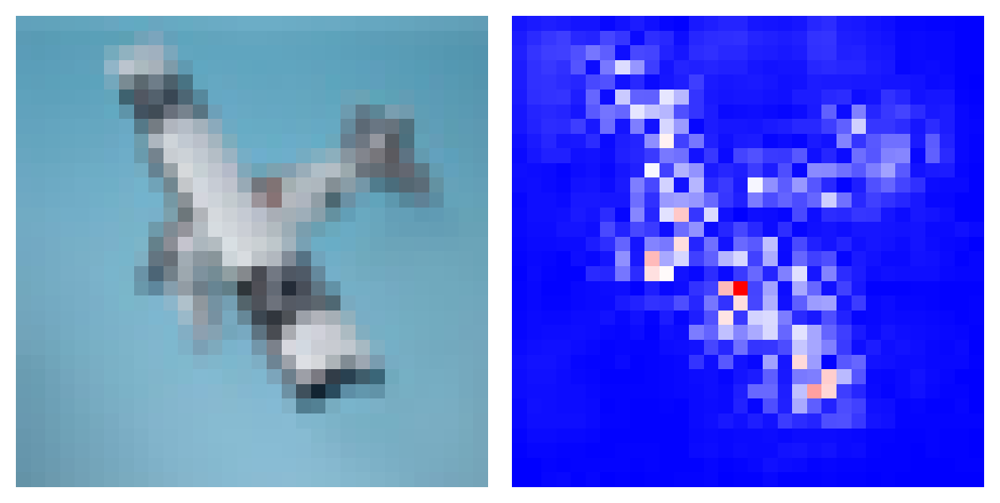

In [17]:
from matplotlib import colors
fig, (ax1, ax2) = plt.subplots(ncols=2, tight_layout=True)

ax1.imshow(sample, interpolation='none')
ax1.axis('off')

#ax2.imshow(attr, interpolation='none', cmap='bwr')
#divnorm = colors.TwoSlopeNorm(vmin=np.min(attr), vcenter=0., vmax=np.max(attr))
ax2.imshow(attr, cmap='bwr', interpolation='none')
ax2.axis('off')

plt.show()

In [25]:
from captum.attr import visualization as viz

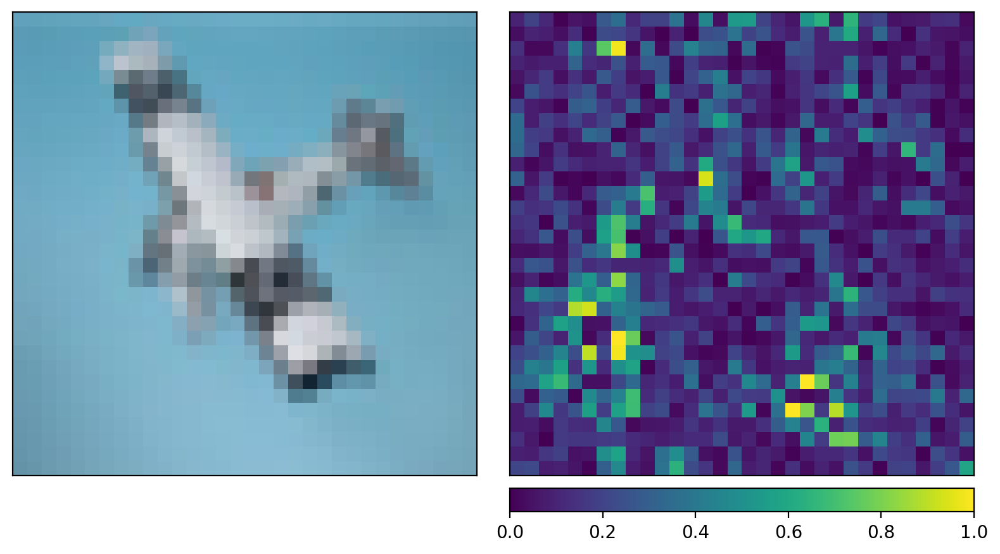

In [34]:
# TODO:
torch.manual_seed(0)
np.random.seed(0)

default_cmap = 'viridis'

gradient_shap = GradientShap(clf)

# Definition of baseline distribution of images
rand_img_dist = torch.cat([sample_norm.unsqueeze(0) * 0, sample_norm.unsqueeze(0) * 1])

attributions_gs = gradient_shap.attribute(
    sample_norm.unsqueeze(0),
    n_samples=1,
    stdevs=0.0001,
    baselines=rand_img_dist,
    target=label
)

_ = viz.visualize_image_attr_multiple(
    np.transpose(attributions_gs.squeeze().cpu().detach().numpy(), (1,2,0)),
    np.transpose(VT.PILToTensor()(sample).squeeze().cpu().detach().numpy(), (1,2,0)),
    ["original_image", "heat_map"],
    ["all", "absolute_value"],
    cmap=default_cmap,
    show_colorbar=True
)